Importing necessary libraries

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt  
from sklearn.model_selection import train_test_split 
from sklearn import metrics
from sklearn.linear_model import Perceptron
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

We did testing on importing the different datasets to see that there are no errors with importing

In [ ]:
# =============================================================================
# # reading gym members dataset
# df = pd.read_csv('gym_members_exercise_tracking.csv', na_values=['NA', '?'])
# 
# # print first 5 rows to check it works
# print(df[:5])
# print(" ")
# 
# # checking to see if there is any missing data
# print(df.isnull().any())
# print(" ")
# =============================================================================

In [ ]:
#------------------------------------------------------------------------------
#Treisis Dataset:
#df = pd.read_csv('housing_price_dataset.csv', na_values=['NA', '?'])

#print 5 rows

#print(df[:5])
#print(" ")

#checking for missing data

#print(df.isnull().any())
#------------------------------------------------------------------------------

In [ ]:
#Fatima Dataset:

# Load the dataset and handle NA values
#df = pd.read_csv('heart_attack_analysis.csv', na_values=['NA', '?'])

# Print the entire DataFrame
#pd.set_option('display.max_rows', None)  # all rows
#print(df)
#print(" ")

# Checking for missing data in all columns
#print("Missing data in each column:")
#print(df.isnull().any())

We finally settled on the mushroom dataset and loaded it in

In [6]:
# Load the dataset and handle NA values
df = pd.read_csv('mushroom_cleaned.csv', na_values=['NA', '?'])

# Print the entire DataFrame
pd.set_option('display.max_rows', None)  # all rows
print(df)
print(" ")

# Checking for missing data in all columns
print("Missing data in each column:")
print(df.isnull().any())
print(" ")

       cap-diameter  cap-shape  gill-attachment  gill-color  stem-height  \
0              1372          2                2          10     3.807467   
1              1461          2                2          10     3.807467   
2              1371          2                2          10     3.612496   
3              1261          6                2          10     3.787572   
4              1305          6                2          10     3.711971   
5              1337          6                2          10     3.775635   
6              1300          2                2          10     3.835320   
7              1354          6                2          10     3.676160   
8              1222          6                2          10     3.771656   
9              1085          6                2          10     3.775635   
10             1214          6                2          10     3.696055   
11              642          6                2          10     0.286062   
12          

Printed the entire dataset just to be sure

In [7]:
# Print the entire DataFrame
pd.set_option('display.max_rows', None)  # all rows
print(df)
print(" ")

       cap-diameter  cap-shape  gill-attachment  gill-color  stem-height  \
0              1372          2                2          10     3.807467   
1              1461          2                2          10     3.807467   
2              1371          2                2          10     3.612496   
3              1261          6                2          10     3.787572   
4              1305          6                2          10     3.711971   
5              1337          6                2          10     3.775635   
6              1300          2                2          10     3.835320   
7              1354          6                2          10     3.676160   
8              1222          6                2          10     3.771656   
9              1085          6                2          10     3.775635   
10             1214          6                2          10     3.696055   
11              642          6                2          10     0.286062   
12          

Checking to see if there is any null data

In [8]:
# Checking for missing data in all columns
print("Missing data in each column:")
print(df.isnull().any())
print(" ")

Missing data in each column:
cap-diameter       False
cap-shape          False
gill-attachment    False
gill-color         False
stem-height        False
stem-width         False
stem-color         False
season             False
class              False
dtype: bool
 


There was none, so we now we collected all the names of the non-target features and make sure they match
up with the dataset

In [9]:
# collecting  the collumn names for non-target features
result = []
for x in df.columns:
    if x !='class':
        result.append(x)

print("\nFeature names: ")        
print(result)       


Feature names: 
['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color', 'stem-height', 'stem-width', 'stem-color', 'season']


They match! So now we assign the feature and target data and print the shape of
our original data to see if it later matches up to the test and train data

In [10]:
# defining feature and target data
X = df[result].values
y= df['class'].values

# Print the shape of the original data
print("\nOriginal dataset shape:")
print("Features (X):", X.shape)
print("Target (y):", y.shape)


Original dataset shape:
Features (X): (54035, 8)
Target (y): (54035,)


We begin the train_test split with a starting test size of 20% and a random state of 7
as everyone likes the number 7

In [11]:
# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

Now we print the sizes of the training and testing sets

In [12]:
# Print the shape of the split data
print("\nAfter splitting:")
print("Training set - Features (X_train):", X_train.shape, "Target (y_train):", y_train.shape)
print("Testing set - Features (X_test):", X_test.shape, "Target (y_test):", y_test.shape)
print(" ")


After splitting:
Training set - Features (X_train): (43228, 8) Target (y_train): (43228,)
Testing set - Features (X_test): (10807, 8) Target (y_test): (10807,)
 


They match up which is great, now we prepare the standard scaler to use on our data

In [13]:
# preparing the standard scaler
sc = StandardScaler()

sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

print("printing training set")
print(X_train[0])
print(X_train_std[0])
print(" ")

printing training set
[141.           2.           1.           6.           1.21799632
 481.           7.           0.94319455]
[-1.186641   -0.92194427 -0.51520359 -0.41478888  0.70367991 -0.72954114
 -0.436045   -0.0277319 ]
 


Now we implement perceptron model, fit it to the data and make a prediction

In [14]:
# creating perceptron model
per = Perceptron(max_iter=35,tol=0.001,eta0=1)

# training the model with training data (scaled by standard scaler) and training target
per.fit(X_train_std,y_train)

# making prediction for the test data
pred = per.predict(X_test_std)

Now we print the accuracy score from that prediction

In [15]:
# check accuracy with accuracy score
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
print(" ")

Accuracy: 0.48
 


Accuracy is very low (48%) so we have work to do, but first we will plot out a confusion matrix of 
those results

Confusion Matrix:
[[2074 2725]
 [2924 3084]]


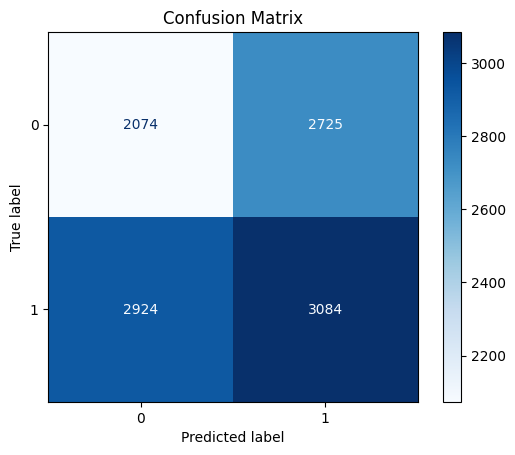

In [16]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, pred)
print("Confusion Matrix:")
print(cm)

# Display confusion matrix as a plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=per.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

Interestingly enough, if we don't use the standard scaler our accuracy is higher (58%)

In [17]:
per = Perceptron(max_iter=35,tol=0.001,eta0=1)
per.fit(X_train, y_train)
pred = per.predict(X_test)
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
print(" ")

Accuracy: 0.56
 


We investigate more and test the boundaries of the split and how far we can go

In [18]:
# Splitting data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
# accuracy score is 0.48

#test with a higher percentage 0.25
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=7)
# accuracy is 0.58

#test with a higher percentage 0.3
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)
# accuracy is 0.58

#test with a higher percentage 0.35
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=7)
# accuracy is 0.62

Turns out having the test size rise to 35% greatly increases the accuracy from 0.48 to 0.62.
So now let's repeat the process with this split. First we add some libraries that we consider using later

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

And now let's go through the procedure using the new split


After splitting:
Training set - Features (X_train): (35122, 8) Target (y_train): (35122,)
Testing set - Features (X_test): (18913, 8) Target (y_test): (18913,)
 
printing training set
[3.60000000e+02 3.00000000e+00 3.00000000e+00 2.00000000e+00
 1.22922961e-01 3.17000000e+03 1.10000000e+01 9.43194554e-01]
[-0.57669116 -0.4612959   0.38343032 -1.66429028 -0.97542357  2.70895181
  0.78771384 -0.02542631]
 
Accuracy: 0.62
 
Confusion Matrix:
[[5262 3206]
 [4032 6413]]


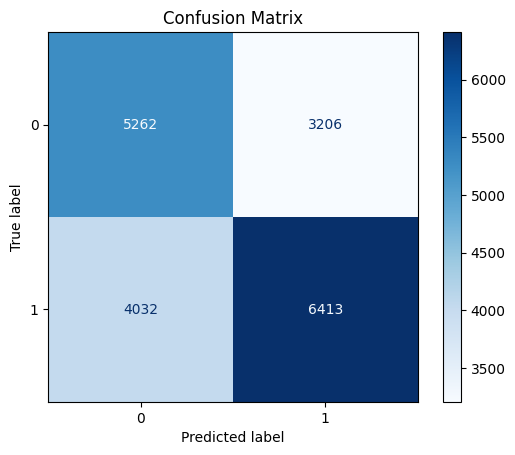

In [20]:
#test with a higher percentage 0.35
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=7)
# accuracy is 0.62


# Print the shape of the split data
print("\nAfter splitting:")
print("Training set - Features (X_train):", X_train.shape, "Target (y_train):", y_train.shape)
print("Testing set - Features (X_test):", X_test.shape, "Target (y_test):", y_test.shape)
print(" ")

# preparing the standard scaler
sc = StandardScaler()

sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

print("printing training set")
print(X_train[0])
print(X_train_std[0])
print(" ")

# not using scaler yield higher accuracy score?
# =============================================================================
# per = Perceptron(max_iter=35,tol=0.001,eta0=1)
# per.fit(X_train, y_train)
# pred0 = per.predict(X_test)
# print('Accuracy: %.2f' % accuracy_score(y_test, pred0))
# print(" ")
# =============================================================================

# creating perceptron model
per = Perceptron(max_iter=35,tol=0.001,eta0=1)

# training the model with training data (scaled by standard scaler) and training target
per.fit(X_train_std,y_train)

# making prediction for the test data
pred = per.predict(X_test_std)

# check accuracy with accuracy score
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
print(" ")



# Calculate confusion matrix
cm = confusion_matrix(y_test, pred)
print("Confusion Matrix:")
print(cm)

# Display confusion matrix as a plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=per.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

It's at this point we find out about the classification report, which will be a powerful tool
for us to monitor our progress. It lists more statistics than just accuracy.

In [21]:
from sklearn.metrics import classification_report 

report = classification_report(y_test, pred) 

print(report) 

              precision    recall  f1-score   support

           0       0.57      0.62      0.59      8468
           1       0.67      0.61      0.64     10445

    accuracy                           0.62     18913
   macro avg       0.62      0.62      0.62     18913
weighted avg       0.62      0.62      0.62     18913



While the mushroom dataset looked promising, it was also extremely similar to a dataset used in tutorial
5, which we didn't initially realise. Just to be safe we decided it would be best to change it for
a different dataset. We found one we wanted to do which is measuring the potability of water
based on a variety of features.

In [22]:
# Load the dataset and handle NA values
df = pd.read_csv('waterpotability.csv', na_values=['NA', '?'])